In [1]:
#loading packages
library(dplyr)
library(Seurat)
library(patchwork)
library(ggplot2)
library(clustree)
library(tibble)
library(dittoSeq)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject

Loading required package: ggraph



# Loading SCT normalised object

In [14]:
data.filt_sct <- readRDS("/home/uqkngu23/90days/software/hncancer_collab_analysis/de_outs/updated_annotations/data.filt_sct.RDS")

In [15]:
#removing spot labelled with N
data.filt_sct <- subset(data.filt_sct, tissues != "N")
table(data.filt_sct$tissues)


  A1   A2   A3   B1   B2   C1   C2   C3   C4   D1   D2 
1125 1505  931 1716 1764  742  766  964  880 1637 1581 

# Perform integration

In [4]:
#splitting by tissues
all.list <- SplitObject(data.filt_sct, split.by = "tissues")
integ_features <- SelectIntegrationFeatures(object.list = all.list, 
                                            nfeatures = 3000) 
seurat.list <- PrepSCTIntegration(object.list = all.list, 
                                  anchor.features = integ_features)

In [5]:
#integration
all.anchors <- FindIntegrationAnchors(object.list = seurat.list, normalization.method = "SCT", dims = 1:30, anchor.features = integ_features)
all.integrated <- IntegrateData(anchorset = all.anchors, normalization.method = "SCT", dims = 1:30, k.weight = 60)

DefaultAssay(all.integrated) <- "integrated"

#dims = Number of dimensions to use in the anchor weighting procedure
#k.weight = Number of neighbors to consider when weighting anchors

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2097 anchors

Filtering anchors

	Retained 1512 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2976 anchors

Filtering anchors

	Retained 1674 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 3006 anchors

Filtering anchors

	Retained 1316 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2700 anchors

Filtering anchors

	Retained 1378 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2421 anchors

Filtering anchors

	Retained 1164 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2673 anchors

Filtering anchors

	Retained 1292 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 2622 anchors

Filtering anchors

	Retained 1459 anchors

Running CCA

Merging objects

Fi

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 1 into 2 6 11

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 10 into 7 8 9 5 3

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 2 6 11 1 into 7 8 9 5 3 10

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging dataset 4 into 7 8 9 5 3 10 2 6 11 1

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data



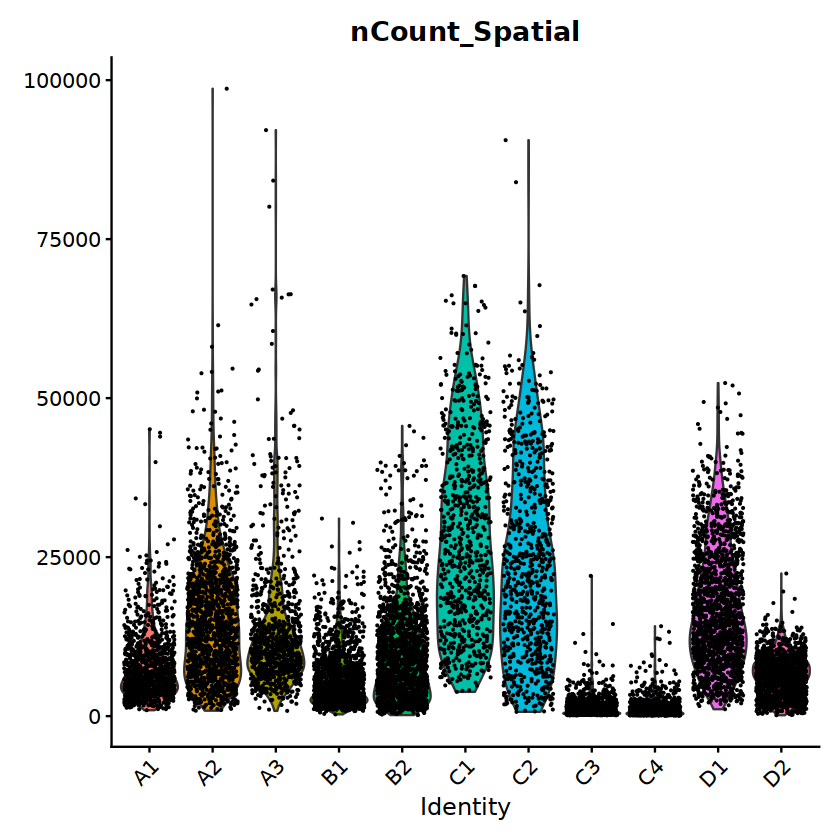

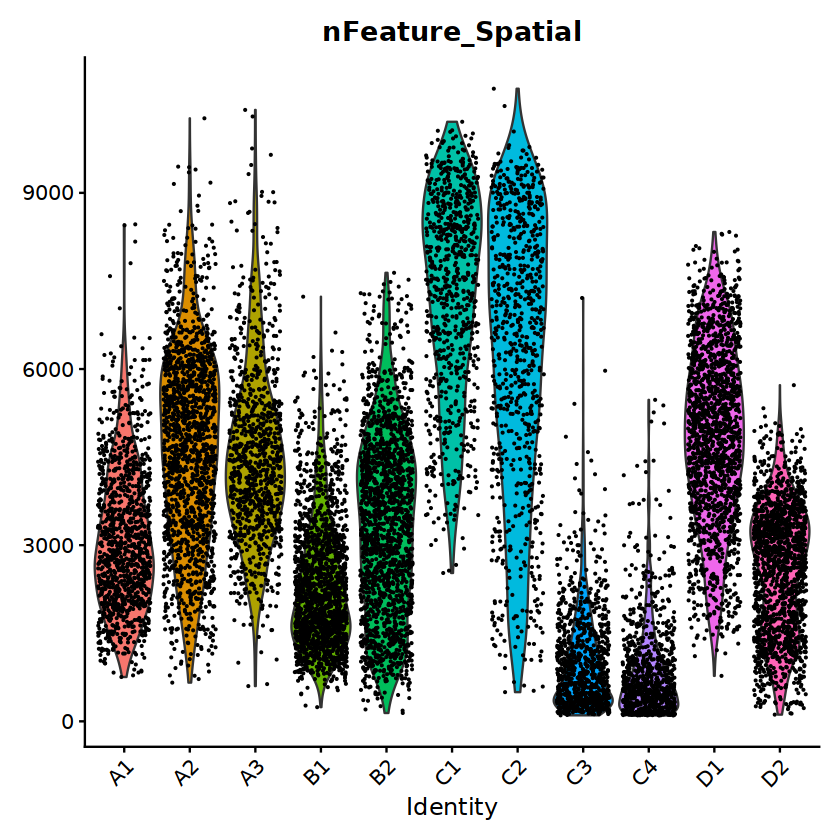

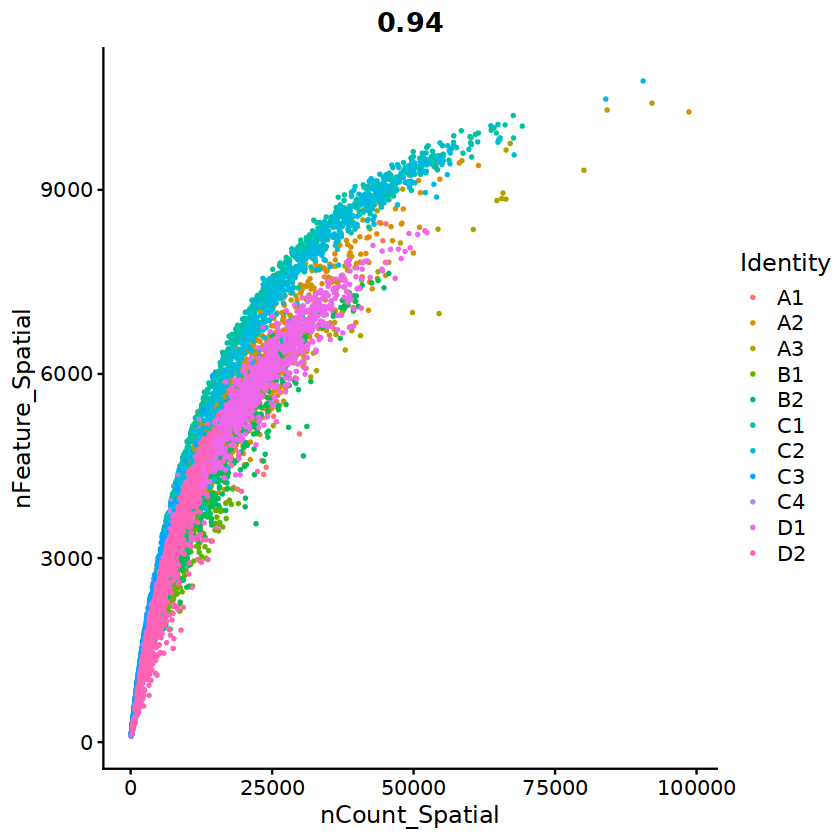

In [8]:
VlnPlot(all.integrated, group.by = "tissues", features = "nCount_Spatial",pt.size = 0.1) + NoLegend()

VlnPlot(all.integrated, group.by = "tissues", features = "nFeature_Spatial",pt.size = 0.1)+ NoLegend()

FeatureScatter(all.integrated, "nCount_Spatial","nFeature_Spatial", group.by = "tissues", pt.size = 0.5)

In [6]:
# Run the standard workflow for visualization and clustering
all.integrated <- ScaleData(all.integrated, verbose = FALSE)
all.integrated <- RunPCA(all.integrated, npcs = 50, verbose = FALSE)
#npcs can effect UMAP 
##do elbow plot of pcas to see where it plateaus
all.integrated <- RunUMAP(all.integrated, reduction = "pca", dims = 1:50,n.neighbors = 5, min.dist = 0.1)
#nneighbours - 30 is default -> can go down to 5 sometimes
#min.dist - 0.3 is default? -> can go down to 0.1
#when it is smaller -> can look spiky and weird
all.integrated <- FindNeighbors(all.integrated, reduction = "pca", dims = 1:50)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
08:50:51 UMAP embedding parameters a = 1.577 b = 0.8951

08:50:51 Read 13611 rows and found 50 numeric columns

08:50:51 Using Annoy for neighbor search, n_neighbors = 5

08:50:51 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

08:50:54 Writing NN index file to temp file /scratch/tmp/pbs.877786.delta2/RtmpMUNXXL/file642a2dfe8dcc

08:50:54 Searching Annoy index using 1 thread, search_k = 500

08:50:55 Annoy recall = 100%

08:50:57 Commencing smooth kNN distance calibration using 1 thread
 

In [7]:
outdir <- "/home/uqkngu23/90days/software/hncancer_collab_analysis/cluster_outs/"
# I already ran findNeighbours above
df.2 <- FindClusters(all.integrated, resolution = 0)
df.2 <- FindClusters(df.2, resolution = 0.1)
df.2 <- FindClusters(df.2, resolution = 0.2)
df.2 <- FindClusters(df.2, resolution = 0.3)
df.2 <- FindClusters(df.2, resolution = 0.4)
df.2 <- FindClusters(df.2, resolution = 0.6)
df.2 <- FindClusters(df.2, resolution = 0.8)
df.2 <- FindClusters(df.2, resolution = 1)
df.2 <- FindClusters(df.2, resolution = 1.2)
clust <- clustree(df.2, prefix = "integrated_snn_res.", node_colour = "sc3_stability")
stability <- clust$data[,c("integrated_snn_res.", "sc3_stability")]
write.table(stability, file = paste0(outdir, "50pca_by_tissue_clustree_stability_v2.txt"), sep = "\t", quote = FALSE, row.names = FALSE, col.names = TRUE)
stability.ave <- aggregate(as.numeric(stability$sc3_stability), list(stability$integrated_snn_res.), mean)
rownames(stability.ave) <- stability.ave$Group.1
stability.ave$Group.1 <- NULL
bestres <- as.numeric(rownames(stability.ave)[which.max(stability.ave$x)])
all.integrated <- FindClusters(all.integrated, resolution = bestres)

all.integrated2 <- all.integrated #save a backup
#save .RDS
saveRDS(all.integrated, file = paste0(outdir, "50pca_all.integrated_by_tissue_v2.RDS"))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13611
Number of edges: 882871

Running Louvain algorithm...
Maximum modularity in 10 random starts: 1.0000
Number of communities: 5
Elapsed time: 3 seconds


4 singletons identified. 1 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13611
Number of edges: 882871

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9325
Number of communities: 9
Elapsed time: 3 seconds


4 singletons identified. 5 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13611
Number of edges: 882871

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9024
Number of communities: 12
Elapsed time: 3 seconds


4 singletons identified. 8 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13611
Number of edges: 882871

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8823
Number of communities: 15
Elapsed time: 4 seconds


4 singletons identified. 11 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13611
Number of edges: 882871

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8652
Number of communities: 17
Elapsed time: 3 seconds


4 singletons identified. 13 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13611
Number of edges: 882871

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8370
Number of communities: 19
Elapsed time: 3 seconds


4 singletons identified. 15 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13611
Number of edges: 882871

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8135
Number of communities: 22
Elapsed time: 3 seconds


4 singletons identified. 18 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13611
Number of edges: 882871

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7933
Number of communities: 23
Elapsed time: 3 seconds


4 singletons identified. 19 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13611
Number of edges: 882871

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7763
Number of communities: 25
Elapsed time: 3 seconds


4 singletons identified. 21 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13611
Number of edges: 882871

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9325
Number of communities: 9
Elapsed time: 3 seconds


4 singletons identified. 5 final clusters.



# Loading RDS

In [2]:
all.integrated <- readRDS("/home/uqkngu23/90days/software/hncancer_collab_analysis/cluster_outs/50pca_all.integrated_by_tissue_v2.RDS")
head(all.integrated)

,orig.ident,nCount_Spatial,nFeature_Spatial,cell_type,recurrent,tissues,sample_id,p16_status,tissue_site,slide,nCount_SCT,nFeature_SCT,integrated_snn_res.0.1,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>
A_AAACAATCTACTAGCA-1,SeuratProject,7155,3520,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7413,3520,1,1
A_AAACAGAGCGACTCCT-1,SeuratProject,2622,1529,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6568,1971,1,1
A_AAACCACTACACAGAT-1,SeuratProject,5383,2912,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6997,2912,0,0
A_AAACGAAGAACATACC-1,SeuratProject,6063,2758,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7144,2758,0,0
A_AAACGACAGTCTTGCC-1,SeuratProject,9441,4272,stroma,N,A1,P9900_no_event,negative,oropharynx,A,8835,4272,0,0
A_AAACGCCCGAGATCGG-1,SeuratProject,3286,1929,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6978,2127,1,1
A_AAACGGGTTGGTATCC-1,SeuratProject,13908,4131,tumour,N,A1,P9900_no_event,negative,oropharynx,A,8884,3719,2,2
A_AAACGTGTTCGCCCTA-1,SeuratProject,3565,2113,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7126,2267,1,1
A_AAACTAACGTGGCGAC-1,SeuratProject,3832,2162,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7331,2259,0,0


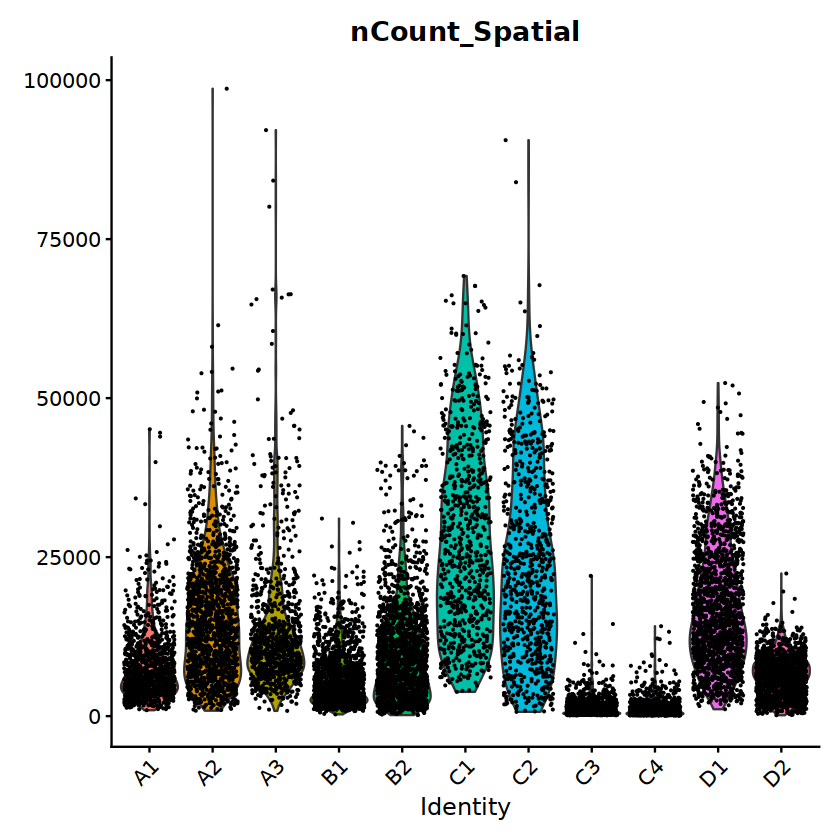

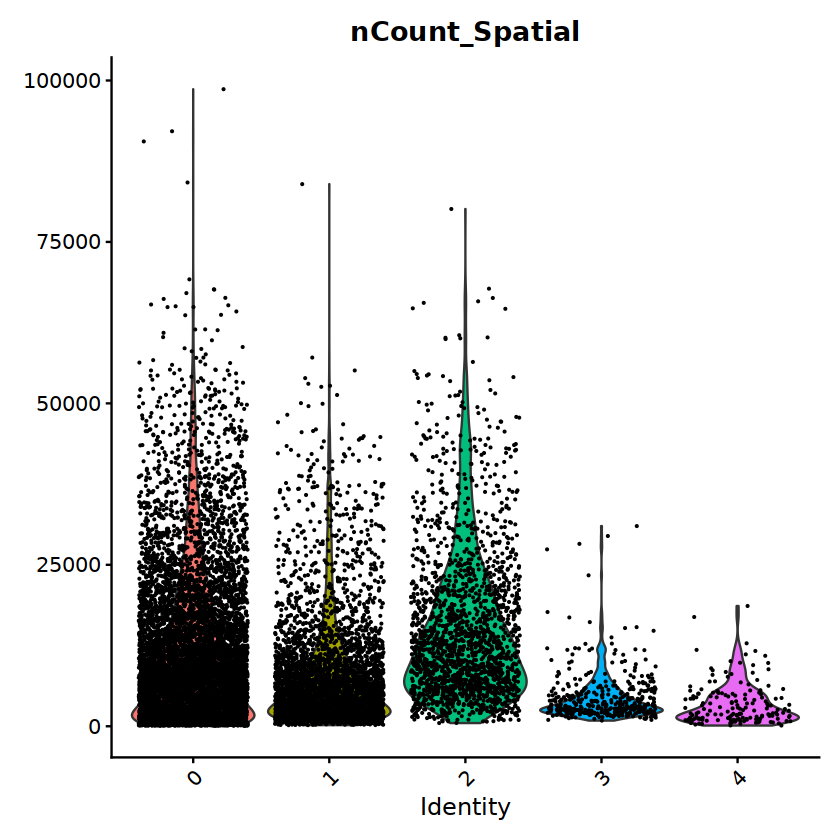

In [8]:
#Violin plot of cluster expression by tissue and recurrent status?
VlnPlot(all.integrated, group.by = "tissues", features = "nCount_Spatial",pt.size = 0.1) + NoLegend()
#spot count by cluster
VlnPlot(all.integrated, group.by = "seurat_clusters", features = "nCount_Spatial",pt.size = 0.1) + NoLegend()
#VlnPlot(all.integrated, group.by = "tissues", features = "nFeature_Spatial",pt.size = 0.1)+ NoLegend()

In [6]:
table(all.integrated$recurrent, all.integrated$seurat_clusters)

           
               0    1    2    3    4
  N         3542 2419  766  396  130
  recurrent 3845 1320 1140   16   37

In [4]:
bestres
#0.1

ERROR: Error in eval(expr, envir, enclos): object 'bestres' not found


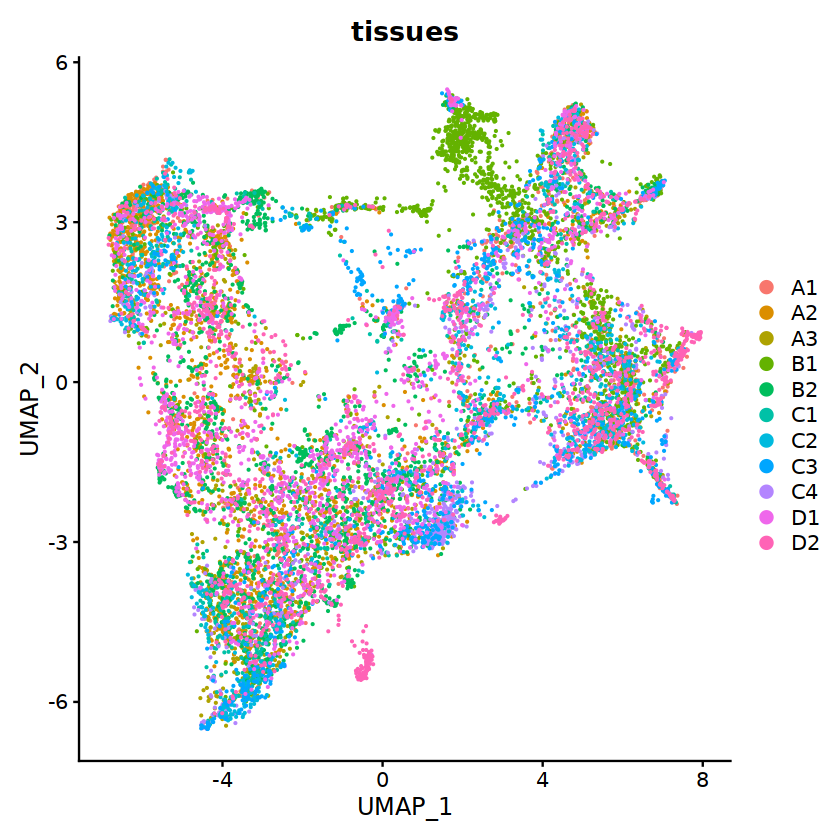

In [3]:
DimPlot(all.integrated, group.by = "tissues")

In [5]:
#save as pdf
outdir <- "/home/uqkngu23/90days/software/hncancer_collab_analysis/cluster_outs/"


png 
  2

In [7]:
pdf(paste0(outdir, "UMAP_by_tissues_smaller_dim.pdf"), width=5, height=5)
DimPlot(all.integrated, group.by = "tissues")
dev.off()

png 
  2

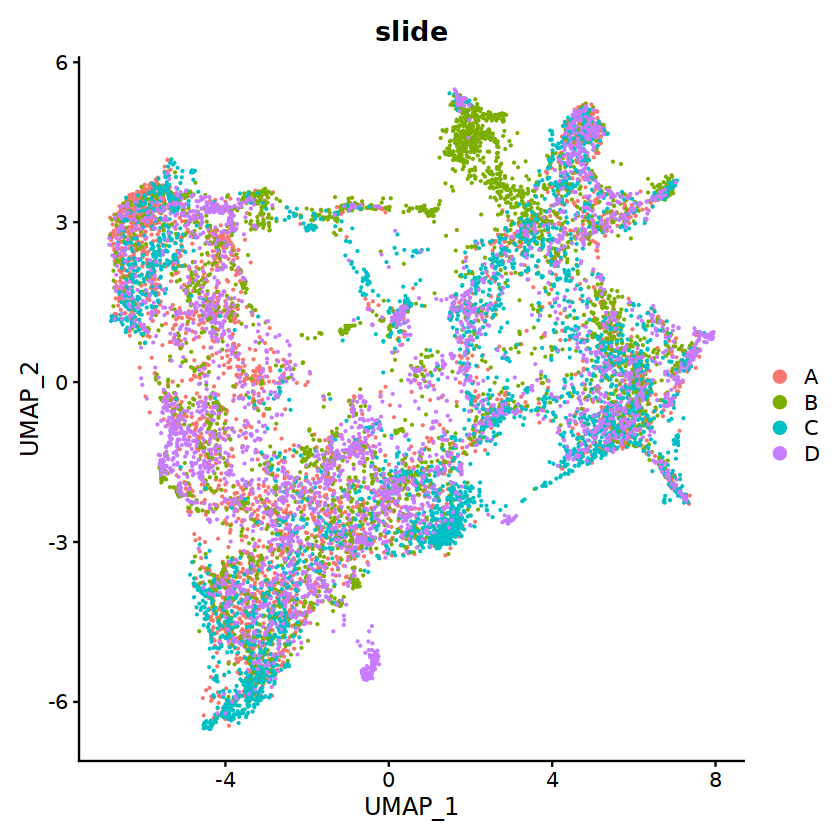

In [11]:
DimPlot(all.integrated, group.by = "slide")

In [4]:
#save as pdf
outdir <- "/home/uqkngu23/90days/software/hncancer_collab_analysis/cluster_outs/"
pdf(paste0(outdir, "UMAP_by_slide.pdf"))
DimPlot(all.integrated, group.by = "slide")
dev.off()

png 
  2

In [9]:
pdf(paste0(outdir, "UMAP_by_slide_smaller_dim.pdf"), width=5, height=5)
DimPlot(all.integrated, group.by = "slide")
dev.off()

png 
  2

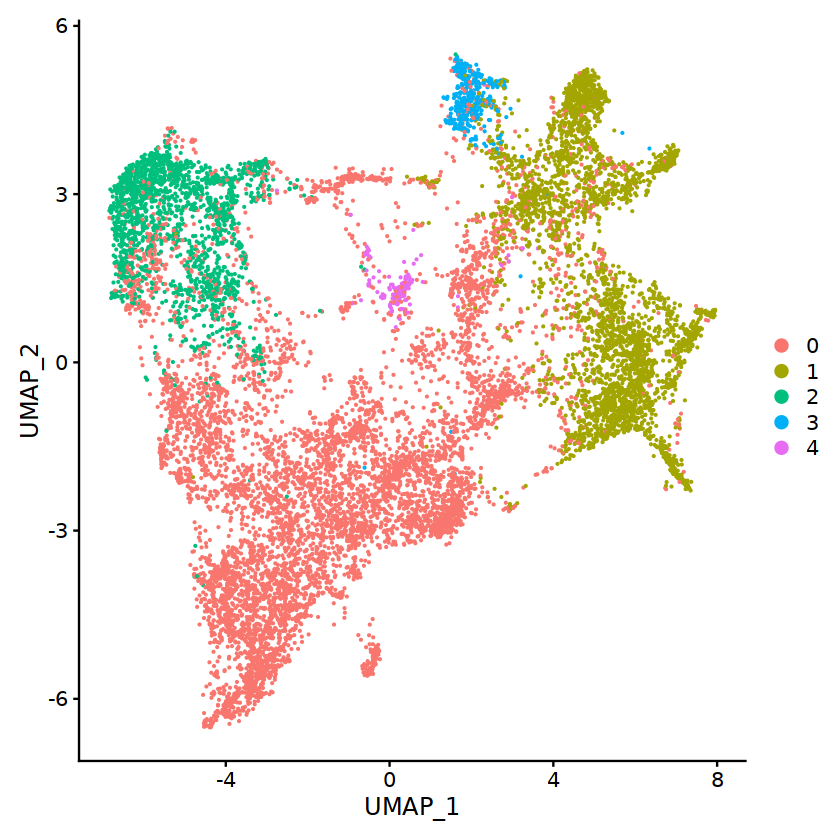

In [10]:
DimPlot(all.integrated)

In [11]:
#save as pdf
outdir <- "/home/uqkngu23/90days/software/hncancer_collab_analysis/cluster_outs/"
pdf(paste0(outdir, "UMAP.pdf"))
DimPlot(all.integrated)
dev.off()

png 
  2

In [12]:
pdf(paste0(outdir, "UMAP_smaller_dim.pdf"), width=5, height=5)
DimPlot(all.integrated)
dev.off()

png 
  2

In [20]:
##### FIND SUB CLUSTER ######
Idents(all.integrated) <- "seurat_clusters"
all.integrated <- FindSubCluster(all.integrated, cluster = "1", graph.name = "integrated_nn", resolution = 0.5)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3739
Number of edges: 33162

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7790
Number of communities: 16
Elapsed time: 0 seconds


8 singletons identified. 8 final clusters.



In [22]:
head(all.integrated)

,orig.ident,nCount_Spatial,nFeature_Spatial,cell_type,recurrent,tissues,sample_id,p16_status,tissue_site,slide,nCount_SCT,nFeature_SCT,integrated_snn_res.0.1,seurat_clusters,sub.cluster
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>,<chr>
A_AAACAATCTACTAGCA-1,SeuratProject,7155,3520,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7413,3520,1,1,1_0
A_AAACAGAGCGACTCCT-1,SeuratProject,2622,1529,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6568,1971,1,1,1_2
A_AAACCACTACACAGAT-1,SeuratProject,5383,2912,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6997,2912,0,0,0
A_AAACGAAGAACATACC-1,SeuratProject,6063,2758,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7144,2758,0,0,0
A_AAACGACAGTCTTGCC-1,SeuratProject,9441,4272,stroma,N,A1,P9900_no_event,negative,oropharynx,A,8835,4272,0,0,0
A_AAACGCCCGAGATCGG-1,SeuratProject,3286,1929,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6978,2127,1,1,1_1
A_AAACGGGTTGGTATCC-1,SeuratProject,13908,4131,tumour,N,A1,P9900_no_event,negative,oropharynx,A,8884,3719,2,2,2
A_AAACGTGTTCGCCCTA-1,SeuratProject,3565,2113,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7126,2267,1,1,1_5
A_AAACTAACGTGGCGAC-1,SeuratProject,3832,2162,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7331,2259,0,0,0


In [24]:
table(all.integrated$sub.cluster)


   0  1_0  1_1  1_2  1_3  1_4  1_5  1_6  1_7    2    3    4 
7387 1077 1002  483  402  288  220  218   49 1906  412  167 

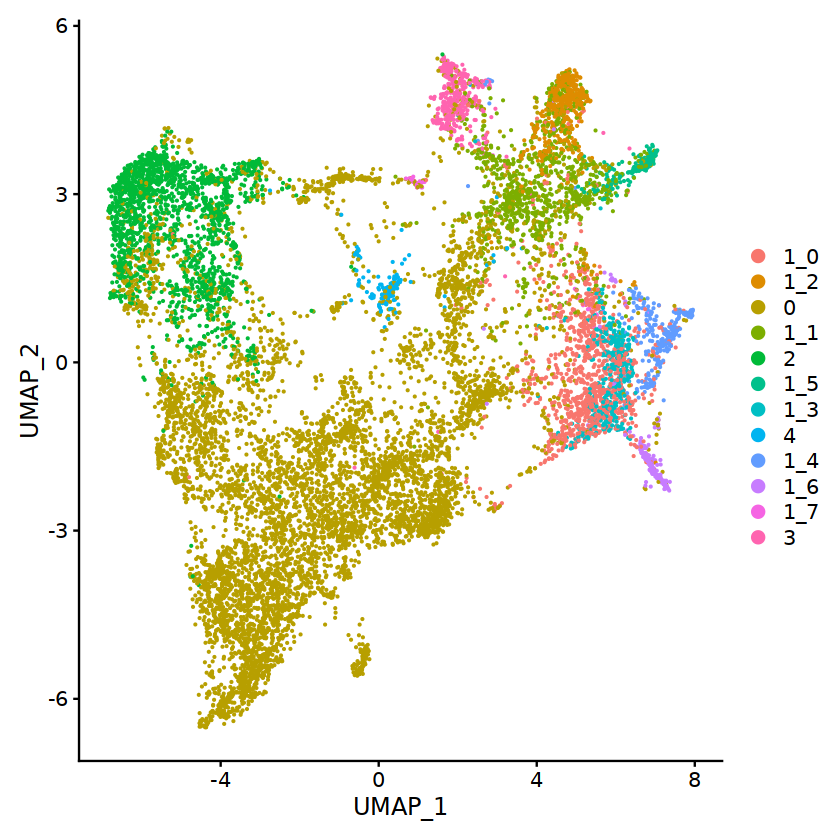

In [23]:
Idents(all.integrated) <- "sub.cluster"
DimPlot(all.integrated)

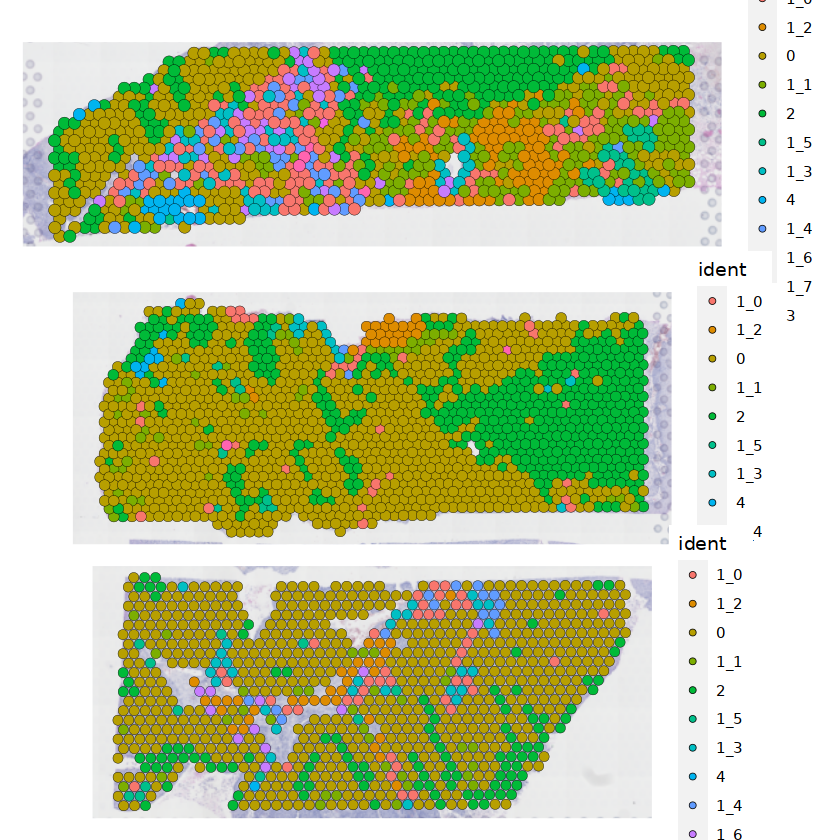

In [25]:
#array A - has subclusters
a <- SpatialDimPlot(all.integrated, images = "slice1")  + theme(aspect.ratio = ratio_A11)
b <- SpatialDimPlot(all.integrated, images = "slice1.2")  + theme(aspect.ratio = ratio_A12)
c <- SpatialDimPlot(all.integrated, images = "slice1.1")  + theme(aspect.ratio = ratio_A13)
a/b/c

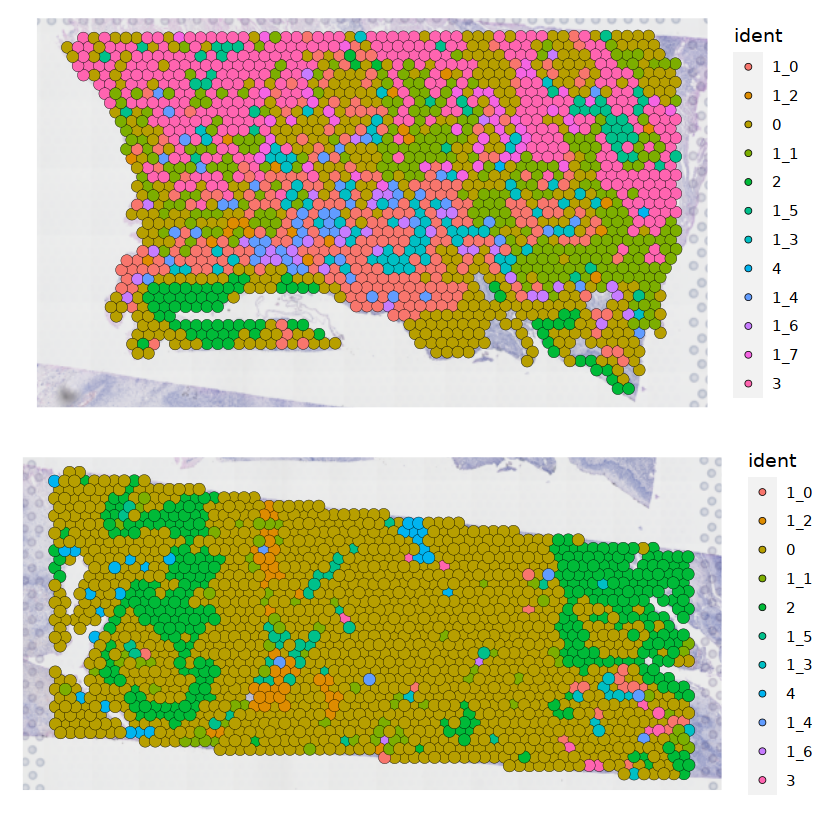

In [26]:
#array B
b1 <- SpatialDimPlot(all.integrated, images = "slice1_B.3") + theme(aspect.ratio = ratio_B11)
b2 <- SpatialDimPlot(all.integrated, images = "slice1_B.4") + theme(aspect.ratio = ratio_B12)
b1/b2

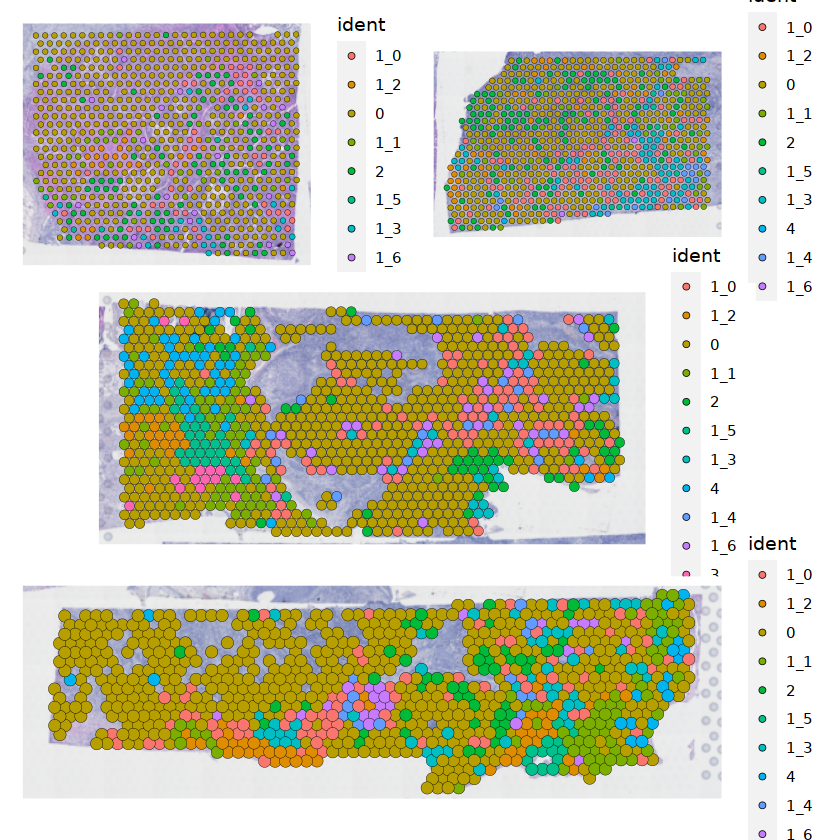

In [27]:
# array C
c1 <- SpatialDimPlot(all.integrated, images = "slice1_C.5") + theme(aspect.ratio = ratio_C11)
c2 <- SpatialDimPlot(all.integrated, images = "slice1_C.7") + theme(aspect.ratio = ratio_C12)
c3 <- SpatialDimPlot(all.integrated, images = "slice1_C.8") + theme(aspect.ratio = ratio_C13)
c4 <- SpatialDimPlot(all.integrated, images = "slice1_C.6") + theme(aspect.ratio = ratio_C14)
(c1 + c2)/c3/c4

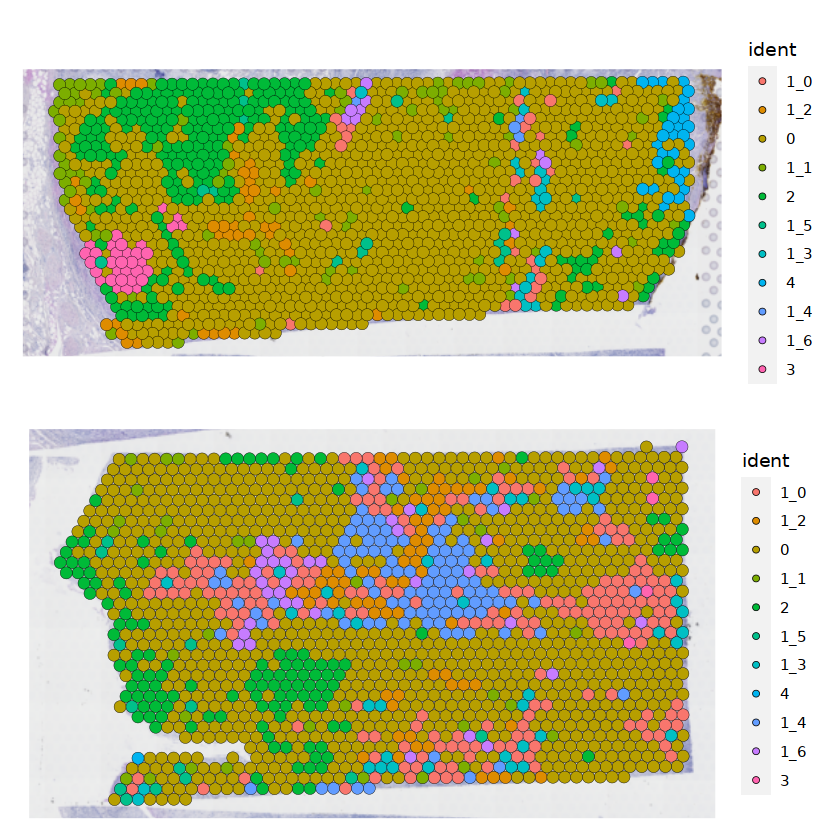

In [28]:
# array D
d1 <- SpatialDimPlot(all.integrated, images = "slice1_D.9") + theme(aspect.ratio = ratio_D11)
d2 <- SpatialDimPlot(all.integrated, images = "slice1_D.10") + theme(aspect.ratio = ratio_D12)

d1/d2

# Re-scaling images

In [16]:
# get cells
A11_cells <- names(which(data.filt_sct$tissues == "A1")) # & data.filt_sct2$cell_type == "tumour"))
A12_cells <- names(which(data.filt_sct$tissues == "A2")) # & data.filt_sct2$cell_type == "tumour"))
A13_cells <- names(which(data.filt_sct$tissues == "A3")) # & data.filt_sct2$cell_type == "tumour"))


# subset
A11 <- subset(data.filt_sct, cells = A11_cells)
A12 <- subset(data.filt_sct, cells = A12_cells)
A13 <- subset(data.filt_sct, cells = A13_cells)

# remove images
A11@images$slice1_B <- NULL
A11@images$slice1_C <- NULL
A11@images$slice1_D <- NULL

A12@images$slice1_B <- NULL
A12@images$slice1_C <- NULL
A12@images$slice1_D <- NULL

A13@images$slice1_B <- NULL
A13@images$slice1_C <- NULL
A13@images$slice1_D <- NULL

coord_A11 <- GetTissueCoordinates(object = A11)
coord_A12 <- GetTissueCoordinates(object = A12)
coord_A13 <- GetTissueCoordinates(object = A13)

ratio_A11 <- (max(coord_A11$imagerow) - min(coord_A11$imagerow)) / (max(coord_A11$imagecol) - min(coord_A11$imagecol))
ratio_A12 <- (max(coord_A12$imagerow) - min(coord_A12$imagerow)) / (max(coord_A12$imagecol) - min(coord_A12$imagecol))
ratio_A13 <- (max(coord_A13$imagerow) - min(coord_A13$imagerow)) / (max(coord_A13$imagecol) - min(coord_A13$imagecol))

In [17]:
# get cells
B11_cells <- names(which(data.filt_sct$tissues == "B1")) #& data.filt_sct$cell_type == "tumour"))
B12_cells <- names(which(data.filt_sct$tissues == "B2")) #& data.filt_sct$cell_type == "tumour"))

# subset
B11 <- subset(data.filt_sct, cells = B11_cells)
B12 <- subset(data.filt_sct, cells = B12_cells)

# remove images
B11@images$slice1 <- NULL
B11@images$slice1_C <- NULL
B11@images$slice1_D <- NULL

B12@images$slice1 <- NULL
B12@images$slice1_C <- NULL
B12@images$slice1_D <- NULL

# Calculating ratios
coord_B11 <- GetTissueCoordinates(object = B11)
coord_B12 <- GetTissueCoordinates(object = B12)

ratio_B11 <- (max(coord_B11$imagerow) - min(coord_B11$imagerow)) / (max(coord_B11$imagecol) - min(coord_B11$imagecol))
ratio_B12 <- (max(coord_B12$imagerow) - min(coord_B12$imagerow)) / (max(coord_B12$imagecol) - min(coord_B12$imagecol))

In [18]:
# get cells
C11_cells <- names(which(data.filt_sct$tissues == "C1")) #& data.filt_sct$cell_type == "tumour"))
C12_cells <- names(which(data.filt_sct$tissues == "C2")) #& data.filt_sct$cell_type == "tumour"))
C13_cells <- names(which(data.filt_sct$tissues == "C3")) #& data.filt_sct$cell_type == "tumour"))
C14_cells <- names(which(data.filt_sct$tissues == "C4")) #& data.filt_sct$cell_type == "tumour"))

# subset
C11 <- subset(data.filt_sct, cells = C11_cells)
C12 <- subset(data.filt_sct, cells = C12_cells)
C13 <- subset(data.filt_sct, cells = C13_cells)
C14 <- subset(data.filt_sct, cells = C14_cells)

# remove images
C11@images$slice1 <- NULL
C11@images$slice1_B <- NULL
C11@images$slice1_D <- NULL

C12@images$slice1 <- NULL
C12@images$slice1_B <- NULL
C12@images$slice1_D <- NULL

C13@images$slice1 <- NULL
C13@images$slice1_B <- NULL
C13@images$slice1_D <- NULL

C14@images$slice1 <- NULL
C14@images$slice1_B <- NULL
C14@images$slice1_D <- NULL

# Calculating ratios
coord_C11 <- GetTissueCoordinates(object = C11)
coord_C12 <- GetTissueCoordinates(object = C12)
coord_C13 <- GetTissueCoordinates(object = C13)
coord_C14 <- GetTissueCoordinates(object = C14)

ratio_C11 <- (max(coord_C11$imagerow) - min(coord_C11$imagerow)) / (max(coord_C11$imagecol) - min(coord_C11$imagecol))
ratio_C12 <- (max(coord_C12$imagerow) - min(coord_C12$imagerow)) / (max(coord_C12$imagecol) - min(coord_C12$imagecol))
ratio_C13 <- (max(coord_C13$imagerow) - min(coord_C13$imagerow)) / (max(coord_C13$imagecol) - min(coord_C13$imagecol))
ratio_C14 <- (max(coord_C14$imagerow) - min(coord_C14$imagerow)) / (max(coord_C14$imagecol) - min(coord_C14$imagecol))

In [19]:
# get cells
D11_cells <- names(which(data.filt_sct$tissues == "D1")) #& data.filt_sct$cell_type == "tumour"))
D12_cells <- names(which(data.filt_sct$tissues == "D2")) #& data.filt_sct$cell_type == "tumour"))
#D13_cells <- names(which(data.filt_sct2$tissues == "D3" & data.filt_sct$cell_type == "tumour"))


# subset
D11 <- subset(data.filt_sct, cells = D11_cells)
D12 <- subset(data.filt_sct, cells = D12_cells)
#D13 <- subset(data.filt_sct2, cells = D13_cells)


# remove images
D11@images$slice1 <- NULL
D11@images$slice1_B <- NULL
D11@images$slice1_C <- NULL

D12@images$slice1 <- NULL
D12@images$slice1_B <- NULL
D12@images$slice1_C <- NULL

#D13@images$slice1 <- NULL
#D13@images$slice1_B <- NULL
#D13@images$slice1_C <- NULL

coord_D11 <- GetTissueCoordinates(object = D11)
coord_D12 <- GetTissueCoordinates(object = D12)
#coord_D13 <- GetTissueCoordinates(object = D13)

ratio_D11 <- (max(coord_D11$imagerow) - min(coord_D11$imagerow)) / (max(coord_D11$imagecol) - min(coord_D11$imagecol))
ratio_D12 <- (max(coord_D12$imagerow) - min(coord_D12$imagerow)) / (max(coord_D12$imagecol) - min(coord_D12$imagecol))
#ratio_D13 <- (max(coord_D13$imagerow) - min(coord_D13$imagerow)) / (max(coord_D13$imagecol) - min(coord_D13$imagecol))

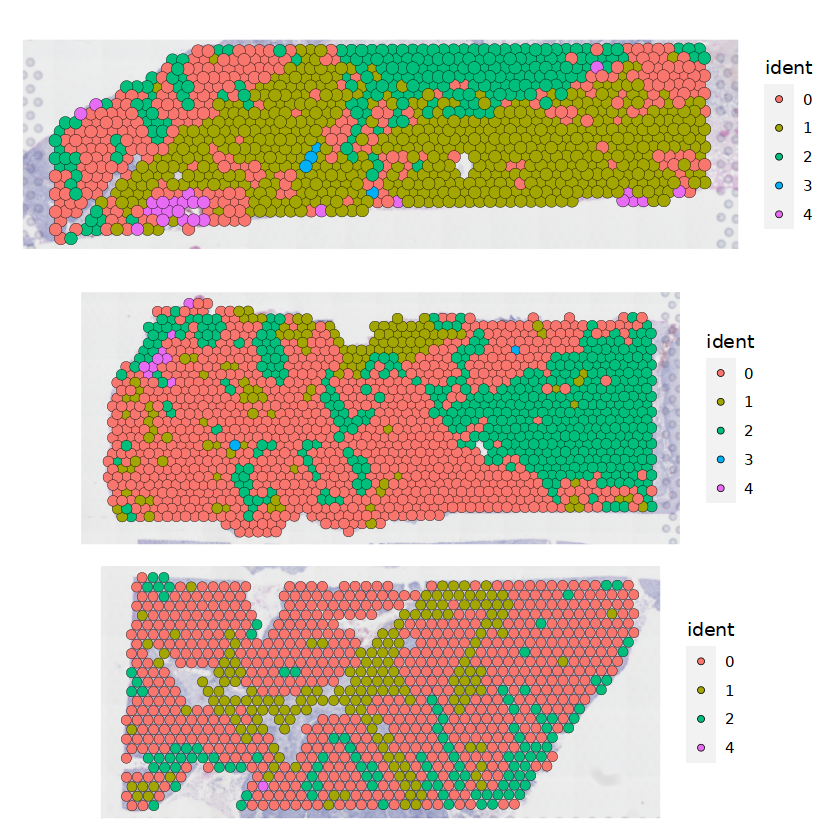

In [20]:
#array A
a <- SpatialDimPlot(all.integrated, images = "slice1")  + theme(aspect.ratio = ratio_A11)
b <- SpatialDimPlot(all.integrated, images = "slice1.2")  + theme(aspect.ratio = ratio_A12)
c <- SpatialDimPlot(all.integrated, images = "slice1.1")  + theme(aspect.ratio = ratio_A13)
a/b/c

In [21]:
#array A
outdir <- "/home/uqkngu23/90days/software/hncancer_collab_analysis/cluster_outs/"
pdf(paste0(outdir, "mapped_clusters_arrayA.pdf"))
print(a/b/c)
dev.off()

png 
  2

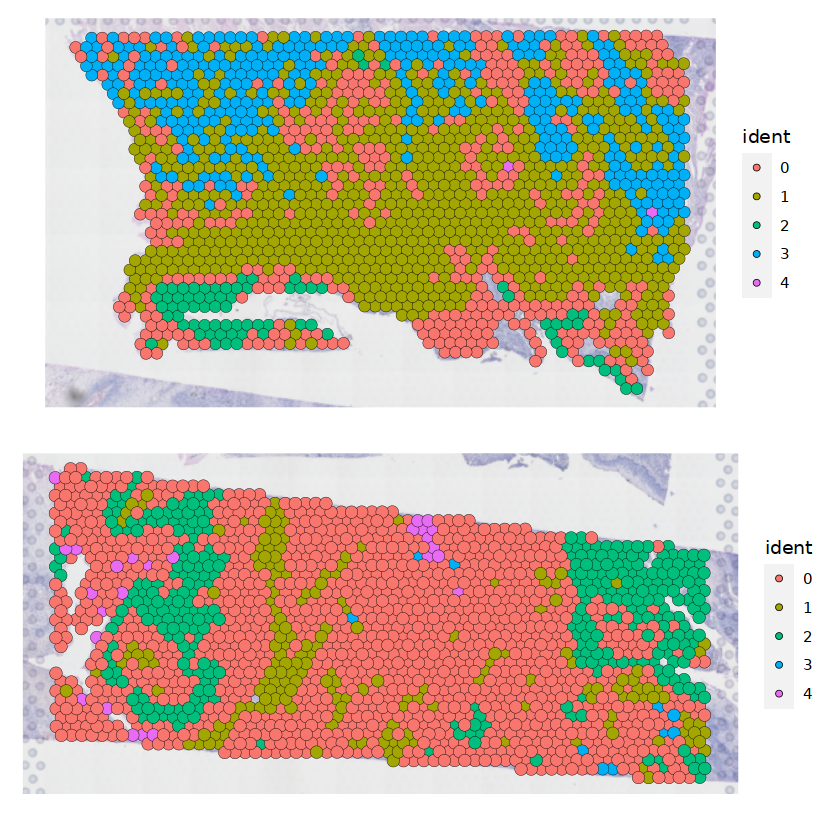

In [23]:
#array B
b1 <- SpatialDimPlot(all.integrated, images = "slice1_B.3") + theme(aspect.ratio = ratio_B11)
b2 <- SpatialDimPlot(all.integrated, images = "slice1_B.4") + theme(aspect.ratio = ratio_B12)
b1/b2

In [24]:
#array B
outdir <- "/home/uqkngu23/90days/software/hncancer_collab_analysis/cluster_outs/"
pdf(paste0(outdir, "mapped_clusters_arrayB.pdf"))
print(b1/b2)
dev.off()

png 
  2

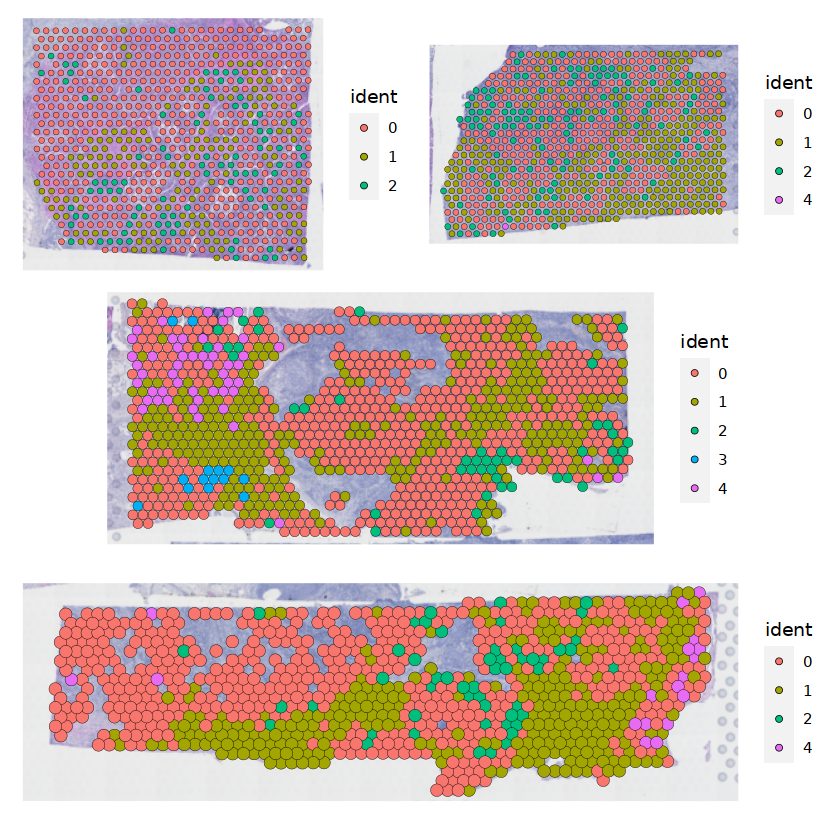

In [25]:
# array C
c1 <- SpatialDimPlot(all.integrated, images = "slice1_C.5") + theme(aspect.ratio = ratio_C11)
c2 <- SpatialDimPlot(all.integrated, images = "slice1_C.7") + theme(aspect.ratio = ratio_C12)
c3 <- SpatialDimPlot(all.integrated, images = "slice1_C.8") + theme(aspect.ratio = ratio_C13)
c4 <- SpatialDimPlot(all.integrated, images = "slice1_C.6") + theme(aspect.ratio = ratio_C14)
(c1 + c2)/c3/c4

In [27]:
#array C
outdir <- "/home/uqkngu23/90days/software/hncancer_collab_analysis/cluster_outs/"
pdf(paste0(outdir, "mapped_clusters_arrayC.pdf"))
print((c1 + c2)/c3/c4)
dev.off()

png 
  2

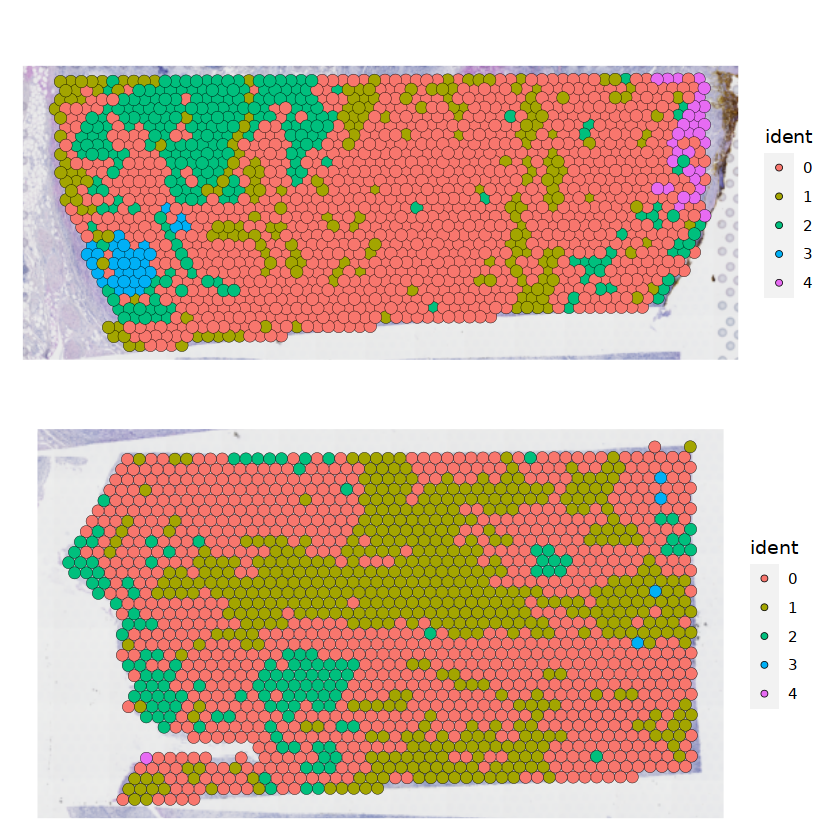

In [26]:
# array D
d1 <- SpatialDimPlot(all.integrated, images = "slice1_D.9") + theme(aspect.ratio = ratio_D11)
d2 <- SpatialDimPlot(all.integrated, images = "slice1_D.10") + theme(aspect.ratio = ratio_D12)

d1/d2

In [28]:
#array D
outdir <- "/home/uqkngu23/90days/software/hncancer_collab_analysis/cluster_outs/"
pdf(paste0(outdir, "mapped_clusters_arrayD.pdf"))
print(d1/d2)
dev.off()

png 
  2

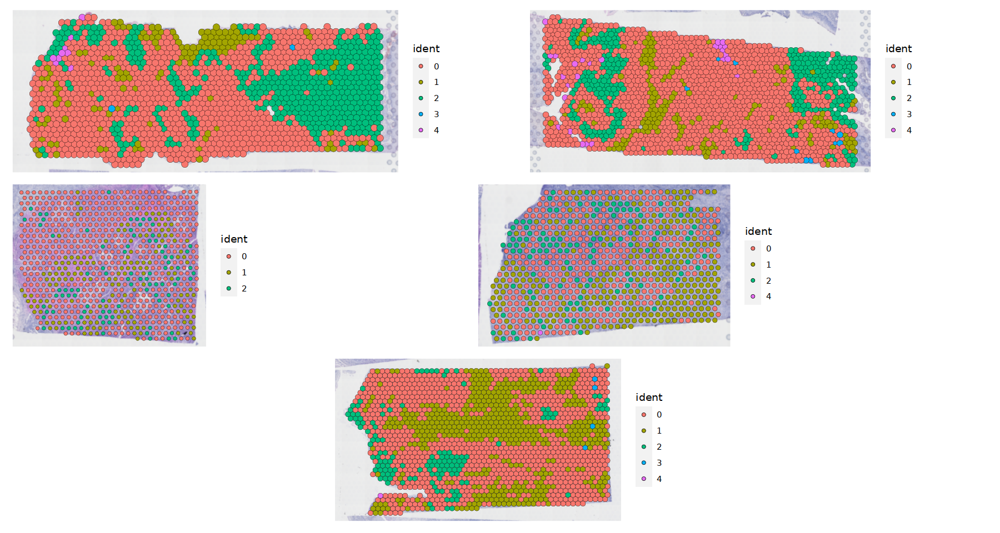

In [29]:
#recurrence 
p1 <- SpatialDimPlot(all.integrated, images = "slice1.2")  + theme(aspect.ratio = ratio_A12)
p2 <- SpatialDimPlot(all.integrated, images = "slice1_B.4") + theme(aspect.ratio = ratio_B12)
p3 <- SpatialDimPlot(all.integrated, images = "slice1_C.5") + theme(aspect.ratio = ratio_C11)
p4 <- SpatialDimPlot(all.integrated, images = "slice1_C.7") + theme(aspect.ratio = ratio_C12)
p5 <- SpatialDimPlot(all.integrated, images = "slice1_D.10") + theme(aspect.ratio = ratio_D12)

options(repr.plot.width=15, repr.plot.height=8)
(p1 + p2)/(p3 + p4)/(p5)

In [30]:
#recurrence
outdir <- "/home/uqkngu23/90days/software/hncancer_collab_analysis/cluster_outs/"
pdf(paste0(outdir, "mapped_clusters_recurrence_tissues.pdf"))
print((p1 + p2)/(p3 + p4)/(p5))
dev.off()

png 
  2

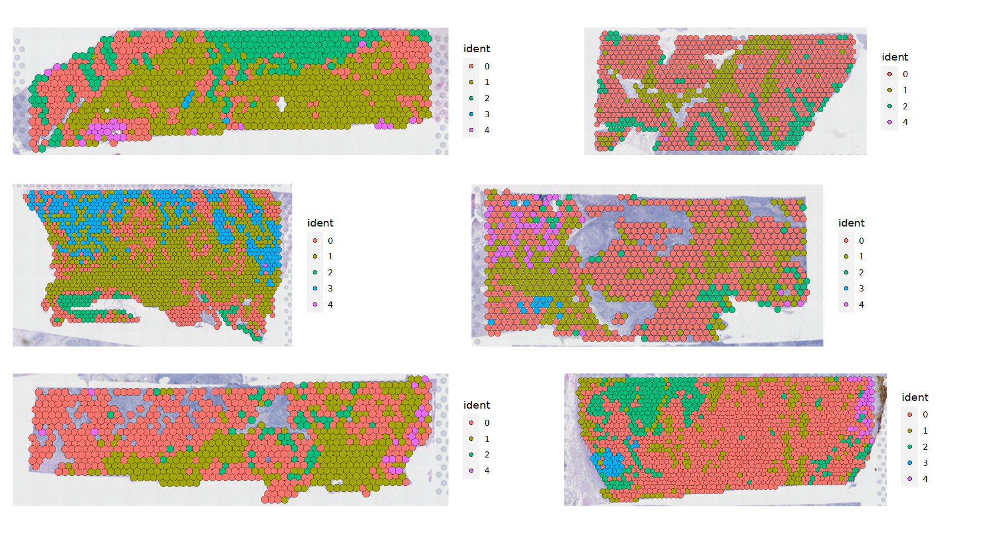

In [31]:
#no recurrence
p1 <- SpatialDimPlot(all.integrated, images = "slice1")  + theme(aspect.ratio = ratio_A11)
p2 <- SpatialDimPlot(all.integrated, images = "slice1.1")  + theme(aspect.ratio = ratio_A13)
p3 <- SpatialDimPlot(all.integrated, images = "slice1_B.3") + theme(aspect.ratio = ratio_B11)
p4 <- SpatialDimPlot(all.integrated, images = "slice1_C.8") + theme(aspect.ratio = ratio_C13)
p5 <- SpatialDimPlot(all.integrated, images = "slice1_C.6") + theme(aspect.ratio = ratio_C14)
p6 <- SpatialDimPlot(all.integrated, images = "slice1_D.9") + theme(aspect.ratio = ratio_D11)
options(repr.plot.width=15, repr.plot.height=8)
(p1 + p2)/(p3 + p4)/(p5 + p6)

#outdir <- "/home/uqkngu23/90days/software/hncancer_collab_analysis/de_outs/new_annotations_outs/tumour_candidate_genes_spatial/normalised/"
#ggsave(filename = paste0(outdir,'Spatial_feature_ZNF254_no_recurrence_tissues_tumour_alpha1.jpeg')
 #      ,width=15,height=8)

In [32]:
#non-recurrence
outdir <- "/home/uqkngu23/90days/software/hncancer_collab_analysis/cluster_outs/"
pdf(paste0(outdir, "mapped_clusters_no_recurrence_tissues.pdf"))
print((p1 + p2)/(p3 + p4)/(p5 + p6))
dev.off()

png 
  2

In [30]:
all.integrated2 <- FindClusters(all.integrated, resolution = 0.2)
head(all.integrated2)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13611
Number of edges: 882871

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9024
Number of communities: 12
Elapsed time: 3 seconds


4 singletons identified. 8 final clusters.



,orig.ident,nCount_Spatial,nFeature_Spatial,cell_type,recurrent,tissues,sample_id,p16_status,tissue_site,slide,nCount_SCT,nFeature_SCT,integrated_snn_res.0.1,seurat_clusters,sub.cluster,integrated_snn_res.0.2
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>,<chr>,<fct>
A_AAACAATCTACTAGCA-1,SeuratProject,7155,3520,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7413,3520,1,2,1_0,2
A_AAACAGAGCGACTCCT-1,SeuratProject,2622,1529,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6568,1971,1,3,1_2,3
A_AAACCACTACACAGAT-1,SeuratProject,5383,2912,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6997,2912,0,0,0,0
A_AAACGAAGAACATACC-1,SeuratProject,6063,2758,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7144,2758,0,0,0,0
A_AAACGACAGTCTTGCC-1,SeuratProject,9441,4272,stroma,N,A1,P9900_no_event,negative,oropharynx,A,8835,4272,0,0,0,0
A_AAACGCCCGAGATCGG-1,SeuratProject,3286,1929,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6978,2127,1,3,1_1,3
A_AAACGGGTTGGTATCC-1,SeuratProject,13908,4131,tumour,N,A1,P9900_no_event,negative,oropharynx,A,8884,3719,2,1,2,1
A_AAACGTGTTCGCCCTA-1,SeuratProject,3565,2113,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7126,2267,1,3,1_5,3
A_AAACTAACGTGGCGAC-1,SeuratProject,3832,2162,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7331,2259,0,0,0,0


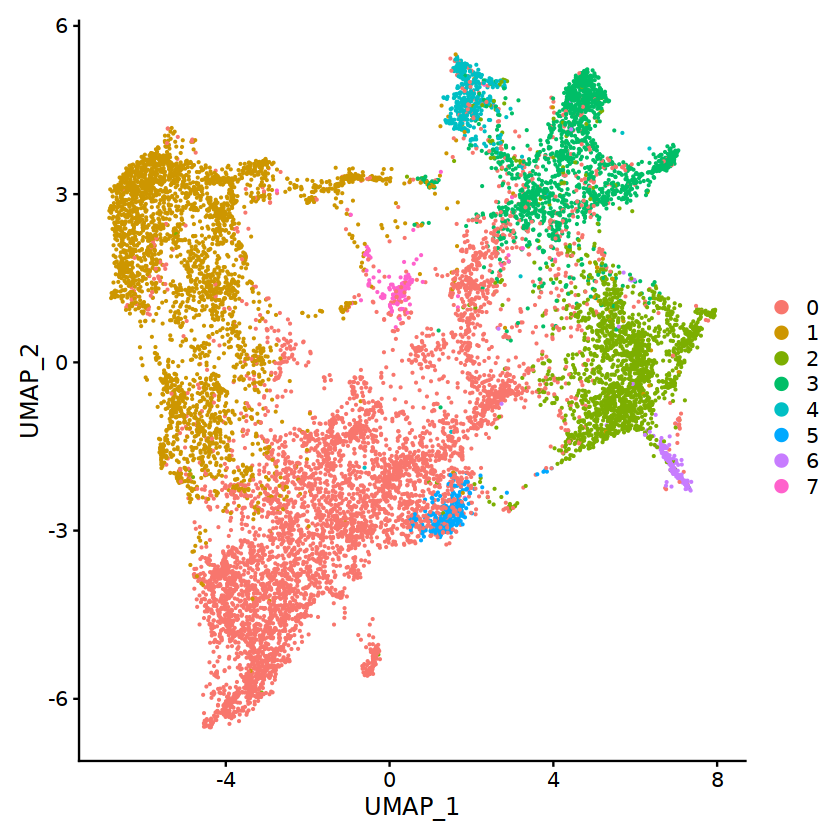

In [31]:
DimPlot(all.integrated2)

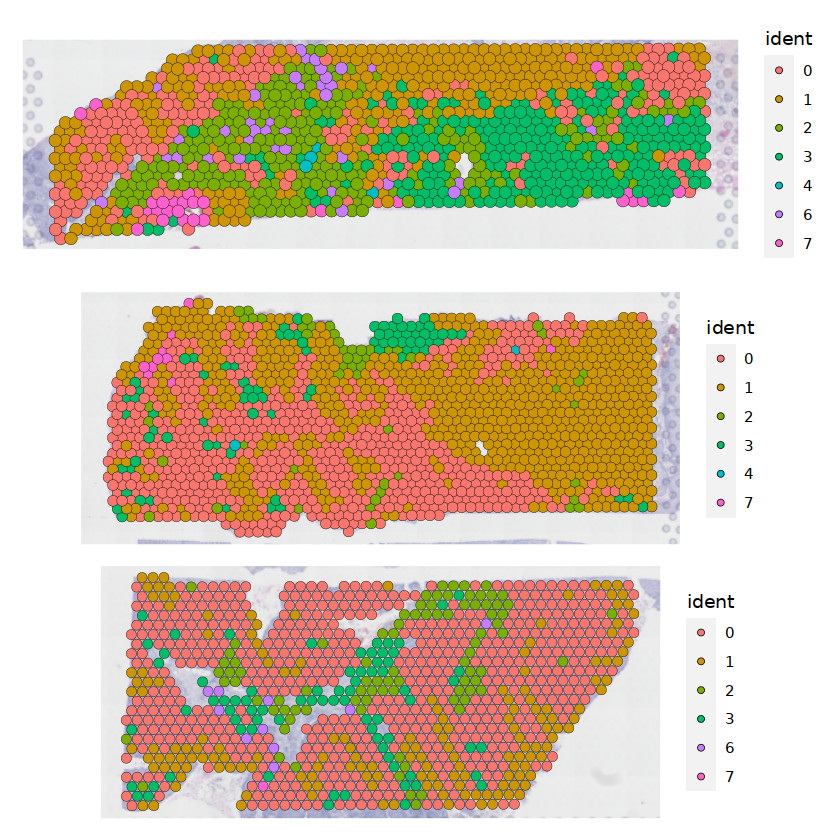

In [32]:
#array A
a <- SpatialDimPlot(all.integrated2, images = "slice1")  + theme(aspect.ratio = ratio_A11)
b <- SpatialDimPlot(all.integrated2, images = "slice1.2")  + theme(aspect.ratio = ratio_A12)
c <- SpatialDimPlot(all.integrated2, images = "slice1.1")  + theme(aspect.ratio = ratio_A13)
a/b/c

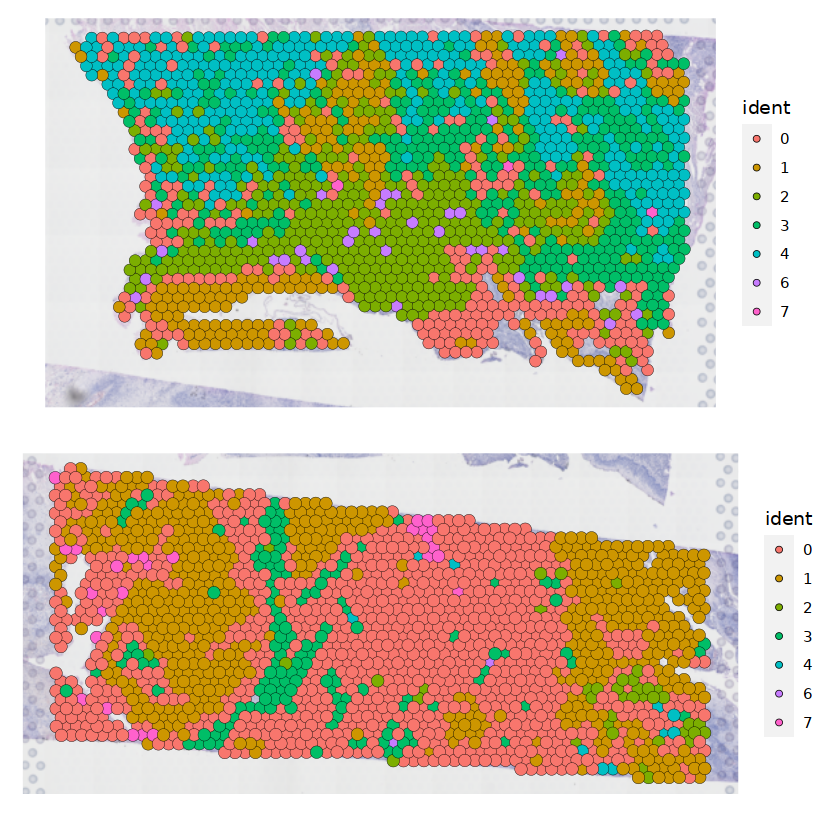

In [33]:
#array B
b1 <- SpatialDimPlot(all.integrated2, images = "slice1_B.3") + theme(aspect.ratio = ratio_B11)
b2 <- SpatialDimPlot(all.integrated2, images = "slice1_B.4") + theme(aspect.ratio = ratio_B12)
b1/b2

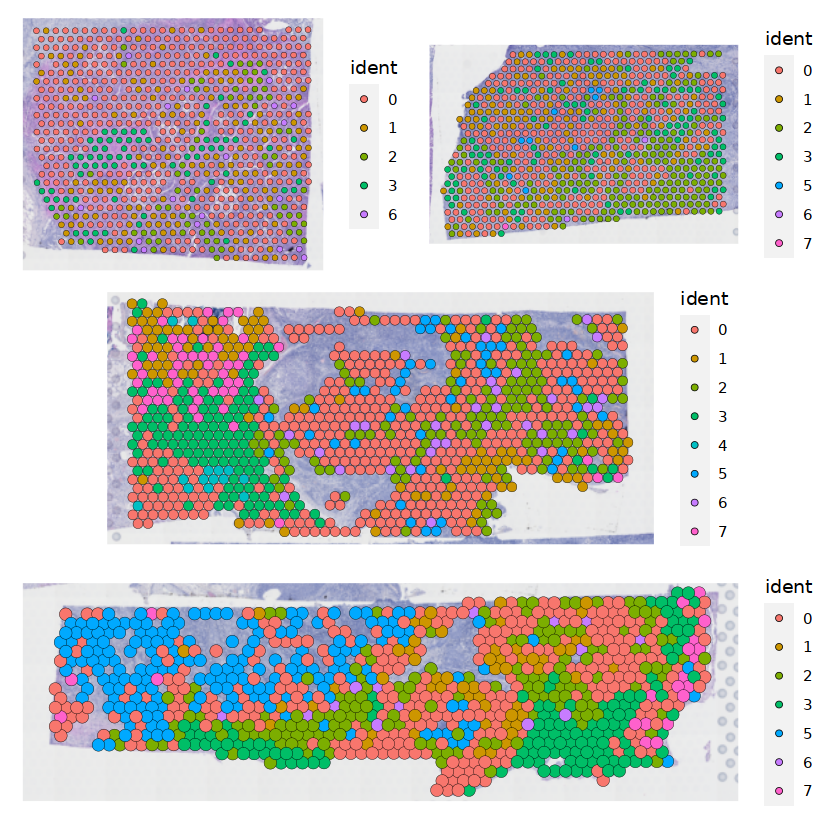

In [34]:
# array C
c1 <- SpatialDimPlot(all.integrated2, images = "slice1_C.5") + theme(aspect.ratio = ratio_C11)
c2 <- SpatialDimPlot(all.integrated2, images = "slice1_C.7") + theme(aspect.ratio = ratio_C12)
c3 <- SpatialDimPlot(all.integrated2, images = "slice1_C.8") + theme(aspect.ratio = ratio_C13)
c4 <- SpatialDimPlot(all.integrated2, images = "slice1_C.6") + theme(aspect.ratio = ratio_C14)
(c1 + c2)/c3/c4

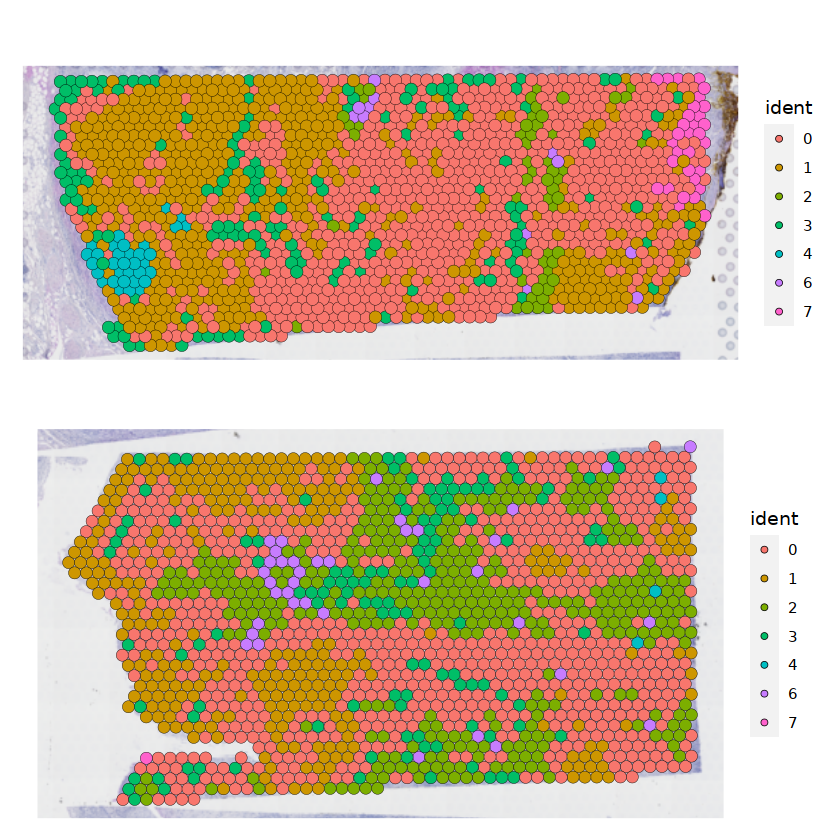

In [35]:
# array D
d1 <- SpatialDimPlot(all.integrated2, images = "slice1_D.9") + theme(aspect.ratio = ratio_D11)
d2 <- SpatialDimPlot(all.integrated2, images = "slice1_D.10") + theme(aspect.ratio = ratio_D12)

d1/d2

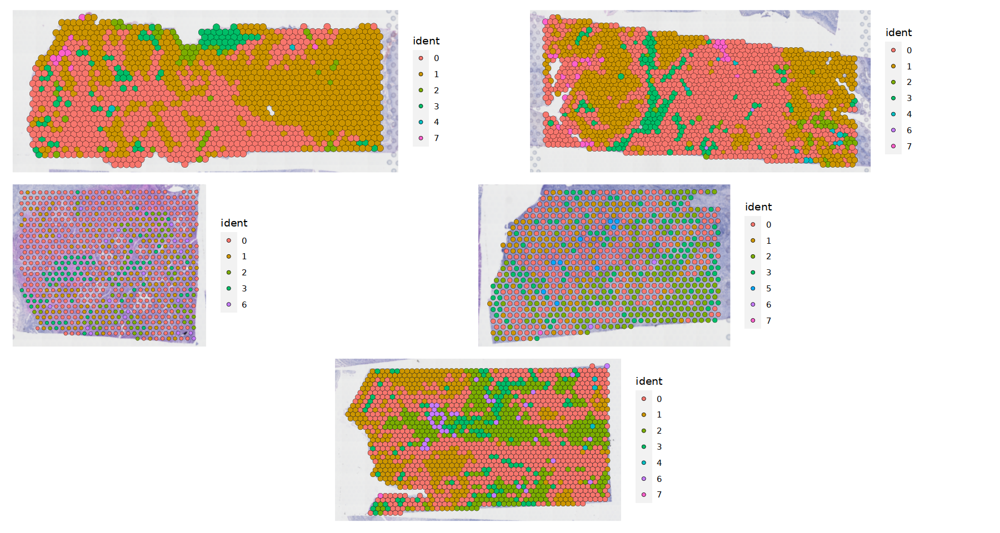

In [36]:
#recurrence 
p1 <- SpatialDimPlot(all.integrated2, images = "slice1.2")  + theme(aspect.ratio = ratio_A12)
p2 <- SpatialDimPlot(all.integrated2, images = "slice1_B.4") + theme(aspect.ratio = ratio_B12)
p3 <- SpatialDimPlot(all.integrated2, images = "slice1_C.5") + theme(aspect.ratio = ratio_C11)
p4 <- SpatialDimPlot(all.integrated2, images = "slice1_C.7") + theme(aspect.ratio = ratio_C12)
p5 <- SpatialDimPlot(all.integrated2, images = "slice1_D.10") + theme(aspect.ratio = ratio_D12)

options(repr.plot.width=15, repr.plot.height=8)
(p1 + p2)/(p3 + p4)/(p5)

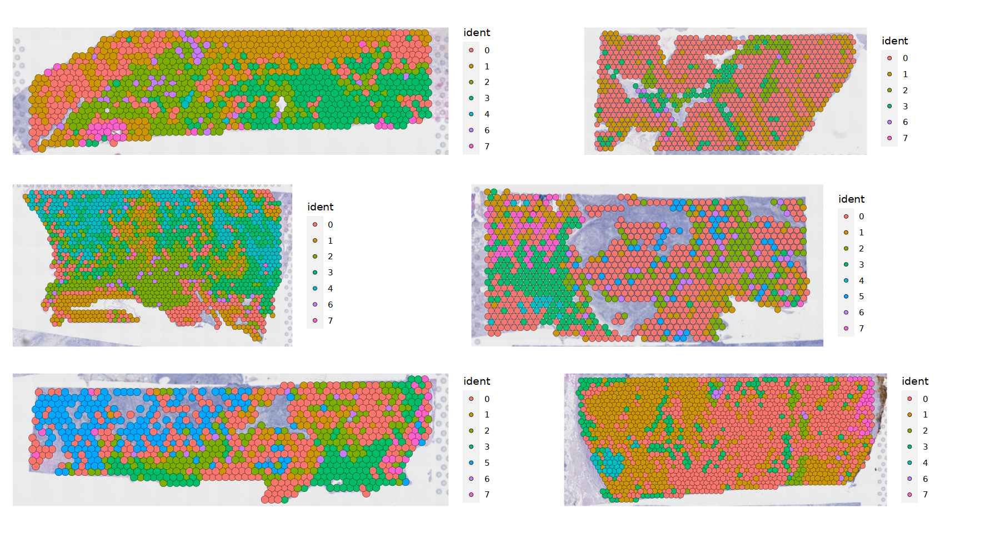

In [37]:
#no recurrence
p1 <- SpatialDimPlot(all.integrated2, images = "slice1")  + theme(aspect.ratio = ratio_A11)
p2 <- SpatialDimPlot(all.integrated2, images = "slice1.1")  + theme(aspect.ratio = ratio_A13)
p3 <- SpatialDimPlot(all.integrated2, images = "slice1_B.3") + theme(aspect.ratio = ratio_B11)
p4 <- SpatialDimPlot(all.integrated2, images = "slice1_C.8") + theme(aspect.ratio = ratio_C13)
p5 <- SpatialDimPlot(all.integrated2, images = "slice1_C.6") + theme(aspect.ratio = ratio_C14)
p6 <- SpatialDimPlot(all.integrated2, images = "slice1_D.9") + theme(aspect.ratio = ratio_D11)
options(repr.plot.width=15, repr.plot.height=8)
(p1 + p2)/(p3 + p4)/(p5 + p6)

#outdir <- "/home/uqkngu23/90days/software/hncancer_collab_analysis/de_outs/new_annotations_outs/tumour_candidate_genes_spatial/normalised/"
#ggsave(filename = paste0(outdir,'Spatial_feature_ZNF254_no_recurrence_tissues_tumour_alpha1.jpeg')
 #      ,width=15,height=8)

In [13]:
head(all.integrated)

,orig.ident,nCount_Spatial,nFeature_Spatial,cell_type,recurrent,tissues,sample_id,p16_status,tissue_site,slide,nCount_SCT,nFeature_SCT,integrated_snn_res.0.1,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>
A_AAACAATCTACTAGCA-1,SeuratProject,7155,3520,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7413,3520,1,1
A_AAACAGAGCGACTCCT-1,SeuratProject,2622,1529,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6568,1971,1,1
A_AAACCACTACACAGAT-1,SeuratProject,5383,2912,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6997,2912,0,0
A_AAACGAAGAACATACC-1,SeuratProject,6063,2758,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7144,2758,0,0
A_AAACGACAGTCTTGCC-1,SeuratProject,9441,4272,stroma,N,A1,P9900_no_event,negative,oropharynx,A,8835,4272,0,0
A_AAACGCCCGAGATCGG-1,SeuratProject,3286,1929,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6978,2127,1,1
A_AAACGGGTTGGTATCC-1,SeuratProject,13908,4131,tumour,N,A1,P9900_no_event,negative,oropharynx,A,8884,3719,2,2
A_AAACGTGTTCGCCCTA-1,SeuratProject,3565,2113,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7126,2267,1,1
A_AAACTAACGTGGCGAC-1,SeuratProject,3832,2162,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7331,2259,0,0


In [16]:
all.integrated <- SetIdent(all.integrated, value = "seurat_clusters")

In [18]:
head(all.integrated)

,orig.ident,nCount_Spatial,nFeature_Spatial,cell_type,recurrent,tissues,sample_id,p16_status,tissue_site,slide,nCount_SCT,nFeature_SCT,integrated_snn_res.0.1,seurat_clusters
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<fct>,<fct>
A_AAACAATCTACTAGCA-1,SeuratProject,7155,3520,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7413,3520,1,1
A_AAACAGAGCGACTCCT-1,SeuratProject,2622,1529,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6568,1971,1,1
A_AAACCACTACACAGAT-1,SeuratProject,5383,2912,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6997,2912,0,0
A_AAACGAAGAACATACC-1,SeuratProject,6063,2758,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7144,2758,0,0
A_AAACGACAGTCTTGCC-1,SeuratProject,9441,4272,stroma,N,A1,P9900_no_event,negative,oropharynx,A,8835,4272,0,0
A_AAACGCCCGAGATCGG-1,SeuratProject,3286,1929,stroma,N,A1,P9900_no_event,negative,oropharynx,A,6978,2127,1,1
A_AAACGGGTTGGTATCC-1,SeuratProject,13908,4131,tumour,N,A1,P9900_no_event,negative,oropharynx,A,8884,3719,2,2
A_AAACGTGTTCGCCCTA-1,SeuratProject,3565,2113,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7126,2267,1,1
A_AAACTAACGTGGCGAC-1,SeuratProject,3832,2162,stroma,N,A1,P9900_no_event,negative,oropharynx,A,7331,2259,0,0


In [27]:
inte <- table(all.integrated$seurat_clusters, all.integrated$recurrent)
inte <- as.data.frame(inte)
head(inte)

,Var1,Var2,Freq
,<fct>,<fct>,<int>
1,0,N,3542
2,1,N,2419
3,2,N,766
4,3,N,396
5,4,N,130
6,0,recurrent,3845


In [23]:
library(RColorBrewer)

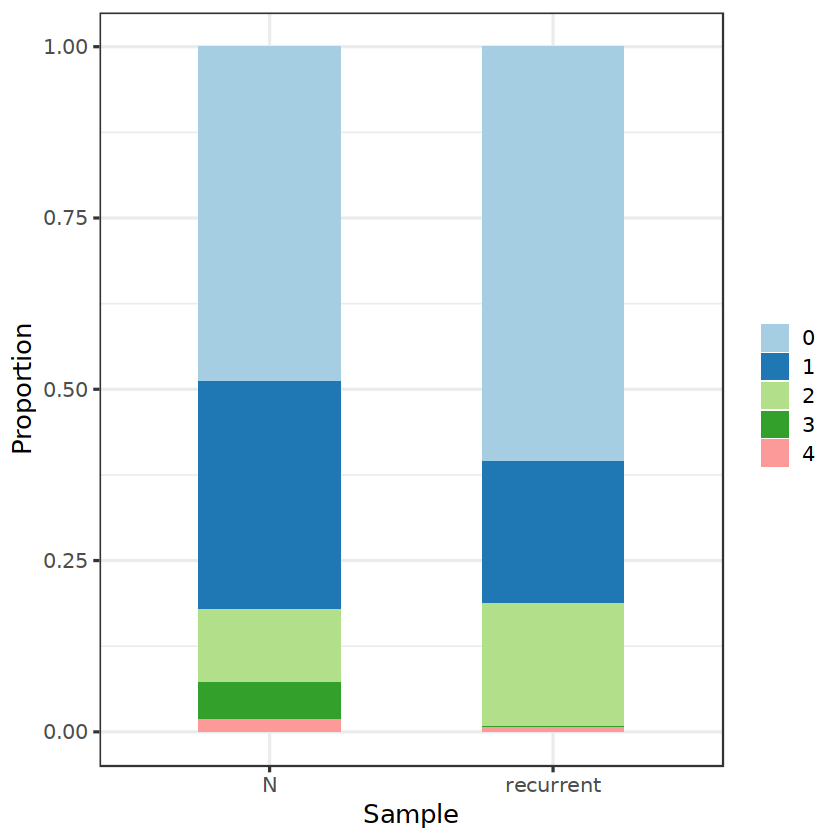

In [28]:
ggplot(inte, aes(x = Var2, y = Freq, fill = Var1)) +
  theme_bw(base_size = 15) +
  geom_col(position = "fill", width = 0.5) +
  xlab("Sample") +
  ylab("Proportion") +
  scale_fill_manual(values = brewer.pal(12, "Paired")) +
  theme(legend.title = element_blank())